# EDA notebook

### •  The aim of this notebook is to apply EDA ,EDA means exploratory data analysis ,It is very important phase we know more about our data ,its pattern applying univariate and bivariet anlysis then detecting and handling outliers

### •  The importance of EDA not only apply analytics and have  bussiness insights but also know which model suits us for machine learing and thus we reduce the time and space complexity of the next phases


### •  The structure of EDA :
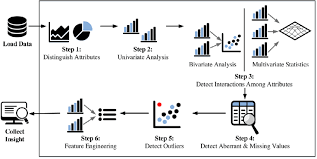

## import libraries that is going to be used in our project 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import time
import random
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.figure_factory as ff
from iso639 import languages
import user_agents
#from ip2geotools.databases.noncommercial import DbIpCity as ip2geo
import requests
import json
#from geopy.distance import great_circle
#from geopy.geocoders import Nominatim
from datasist.structdata import detect_outliers
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from sklearn.preprocessing import OneHotEncoder
from category_encoders import BinaryEncoder 
from datetime import datetime
from sklearn.model_selection import train_test_split , cross_validate
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE , RandomOverSampler
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import r2_score , mean_squared_error , classification_report ,recall_score , precision_score , ConfusionMatrixDisplay , confusion_matrix
from sklearn.linear_model import Ridge , Lasso
from sklearn.tree import DecisionTreeRegressor , DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.ensemble import RandomForestRegressor , RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB , GaussianNB , BernoulliNB
from sklearn.svm import SVC , SVR
from sklearn.ensemble import AdaBoostClassifier , GradientBoostingClassifier
import xgboost as xgb
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore')
import pickle
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering,KMeans,DBSCAN
from sklearn.decomposition import PCA
%matplotlib inline
from imblearn.base import _ParamsValidationMixin

## import the cleaned version of data 

In [2]:
raw_data=pd.read_csv('../data/processed/featured_df.csv')
df=raw_data.copy()
df.sample(5)

,Unnamed: 0,age,annual_income,monthly_inhand_salary,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,num_credit_inquiries,credit_mix,outstanding_debt,credit_utilization_ratio,payment_of_min_amount,total_emi_per_month,amount_invested_monthly,payment_behaviour,monthly_balance,credit_score,credit_history_year,credit_history_month
55839,55839,37,17238,1599.509167,23,9,44,16,11.0,Bad,1500,26.375304,Yes,84.144303,44,High_spent_Small_value_payments,291,Poor,9,3
38987,38987,48,106598,8639.236667,13,4,27,9,5.0,_,1454,29.493812,No,320.892951,785,Low_spent_Medium_value_payments,37,Standard,28,10
38251,38251,32,46162,3548.885000,16,2,41,19,7.0,_,1788,26.129869,Yes,65.956819,51,High_spent_Medium_value_payments,486,Poor,15,8
83188,83188,35,19603,1533.609583,6,1,11,14,0.0,Good,1048,37.148235,No,36121.000000,47,High_spent_Medium_value_payments,345,Standard,21,8
83325,83325,54,38933,0.000000,9,3,15,10,2.0,Good,149,33.029303,NM,78.409851,162,High_spent_Small_value_payments,362,Standard,31,7


## drop unnecessary csv column

In [3]:
df.drop('Unnamed: 0',axis=1,inplace=True)

## looking at the general information of the data frame

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 19 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   age                       100000 non-null  int64  
 1   annual_income             100000 non-null  int64  
 2   monthly_inhand_salary     100000 non-null  float64
 3   interest_rate             100000 non-null  int64  
 4   num_of_loan               100000 non-null  int64  
 5   delay_from_due_date       100000 non-null  int64  
 6   num_of_delayed_payment    100000 non-null  int64  
 7   num_credit_inquiries      100000 non-null  float64
 8   credit_mix                100000 non-null  object 
 9   outstanding_debt          100000 non-null  int64  
 10  credit_utilization_ratio  100000 non-null  float64
 11  payment_of_min_amount     100000 non-null  object 
 12  total_emi_per_month       100000 non-null  float64
 13  amount_invested_monthly   100000 non-null  in

## get number of numerical features so we can have the number of subplots at the end

In [5]:
lst_num=df.select_dtypes('number').columns.to_list()
len(lst_num)

15

## uni variate analysis with handling outliers

<Figure size 640x480 with 0 Axes>

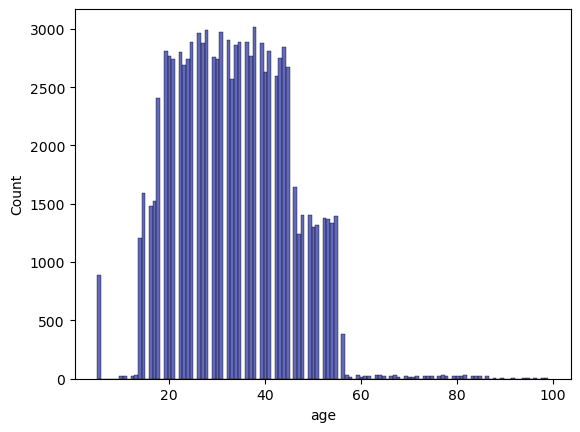

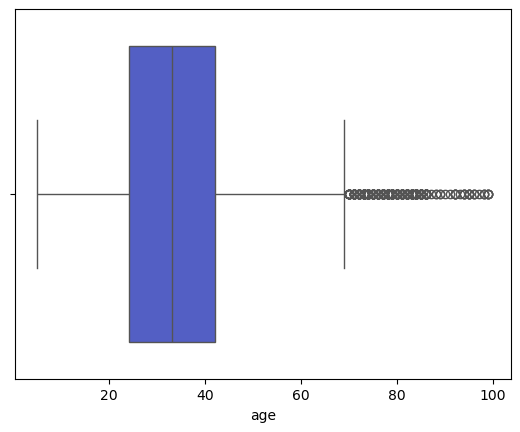

<Figure size 640x480 with 0 Axes>

In [6]:
#apply Data Anlysis
#lets have tour in every column and extract information about every column
#use histolot with random color then box plot to figure out the outliers
#age column
#we have outliers 
sns.histplot(x=df[lst_num[0]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[0]],color=np.random.rand(3,))
plt.figure()

In [7]:
#handle age outliers manually from age 18 to 70 otherwise it will replaced with median of age
lst_age=df[(df['age'] < 18) | (df['age'] >70)].index
lst_age

Index([    2,    56,   113,   219,   289,   290,   291,   292,   293,   294,
       ...
       99802, 99803, 99804, 99805, 99806, 99807, 99937, 99950, 99963, 99972],
      dtype='int64', length=7215)

In [8]:
for i in lst_age:
    df[lst_num[0]].iloc[i]=df['age'].median()

<Figure size 640x480 with 0 Axes>

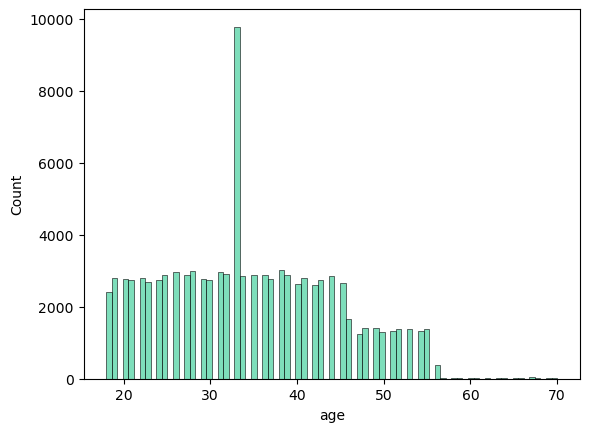

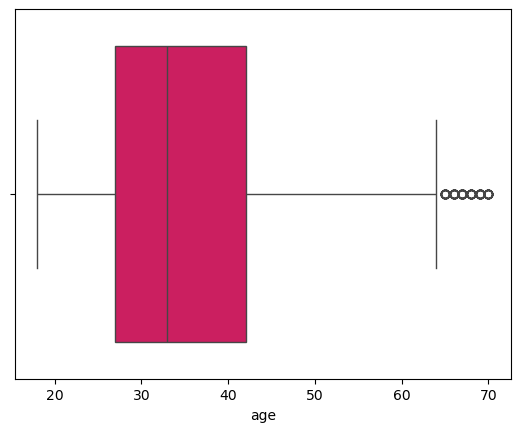

<Figure size 640x480 with 0 Axes>

In [9]:
#check if there are outliers left
sns.histplot(x=df[lst_num[0]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[0]],color=np.random.rand(3,))
plt.figure()

<Figure size 640x480 with 0 Axes>

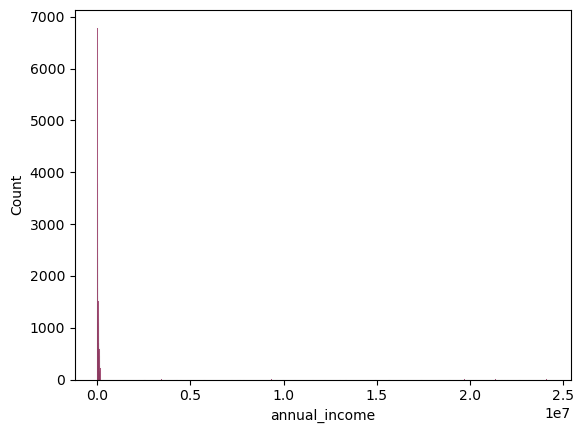

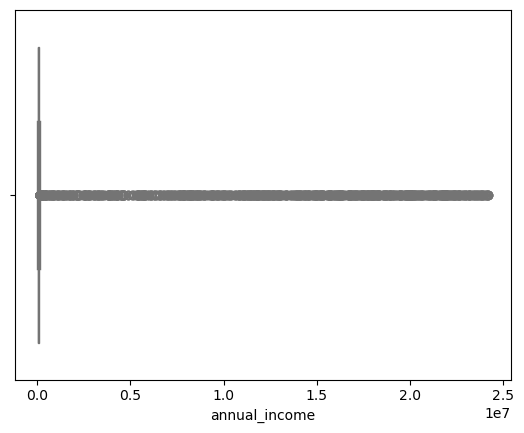

<Figure size 640x480 with 0 Axes>

In [10]:
#annual income column
#we have outliers 
sns.histplot(x=df[lst_num[1]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[1]],color=np.random.rand(3,))
plt.figure()

In [11]:
#handle anuual income outliers manually for any value less than 0.2e+06 (200K) which is too large amount otherwise it will replaced with median of age
lst_annual=df[df['annual_income'] > 0.2e+06].index
lst_annual

Index([   54,   231,   245,   361,   368,   379,   420,   564,   602,   617,
       ...
       99191, 99260, 99264, 99280, 99432, 99664, 99714, 99721, 99882, 99945],
      dtype='int64', length=999)

In [12]:
for i in lst_annual:
    df[lst_num[1]].iloc[i]=df['annual_income'].median()

<Figure size 640x480 with 0 Axes>

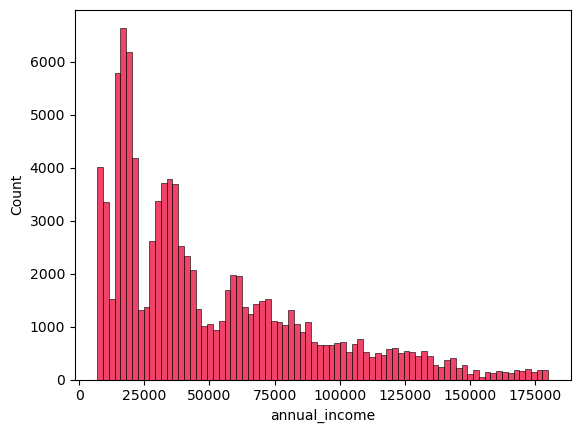

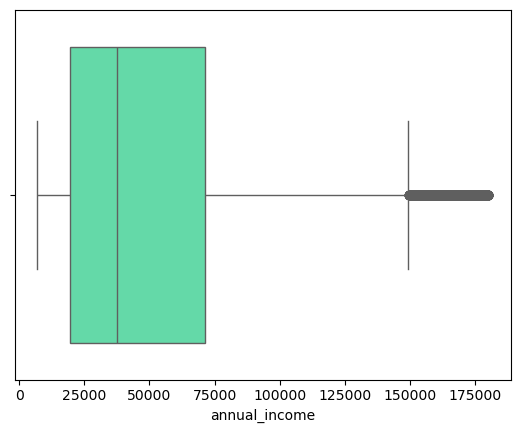

<Figure size 640x480 with 0 Axes>

In [13]:
#check if there are outliers left
sns.histplot(x=df[lst_num[1]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[1]],color=np.random.rand(3,))
plt.figure()

<Figure size 640x480 with 0 Axes>

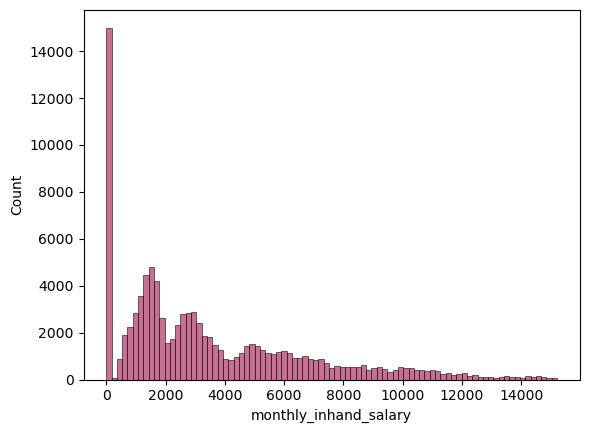

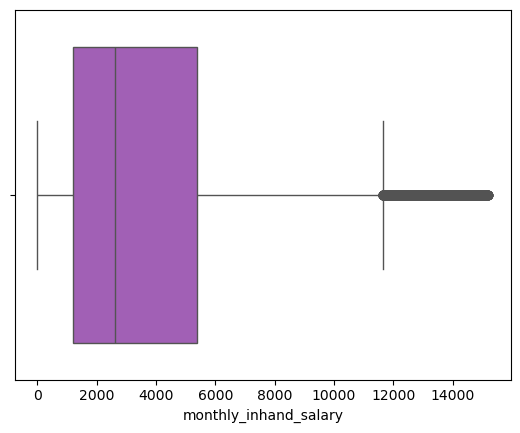

<Figure size 640x480 with 0 Axes>

In [14]:
#monthly_inhand_salary column
#we have outliers 
sns.histplot(x=df[lst_num[2]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[2]],color=np.random.rand(3,))
plt.figure()

In [15]:
#handle monthly inhanded salary outliers manually for any value less than 11K  otherwise it will replaced with median of age
lst_monthly=df[df['monthly_inhand_salary'] > 11000].index
lst_monthly

Index([   16,    17,    19,    20,    21,    22,    23,    48,    49,   344,
       ...
       99670, 99671, 99920, 99921, 99922, 99923, 99924, 99925, 99926, 99927],
      dtype='int64', length=3844)

In [16]:
for i in lst_monthly:
    df[lst_num[2]].iloc[i]=df['monthly_inhand_salary'].median()

<Figure size 640x480 with 0 Axes>

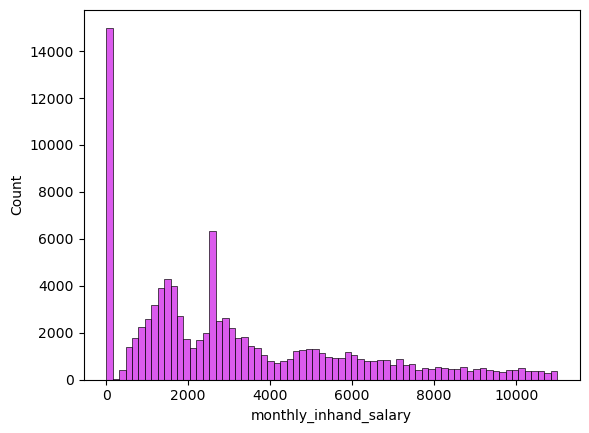

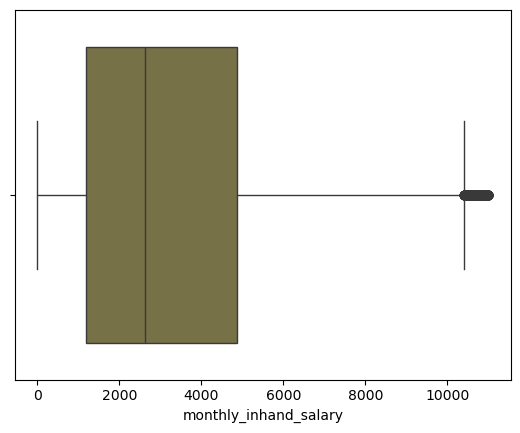

<Figure size 640x480 with 0 Axes>

In [17]:
#check if there are outliers left
sns.histplot(x=df[lst_num[2]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[2]],color=np.random.rand(3,))
plt.figure()

<Figure size 640x480 with 0 Axes>

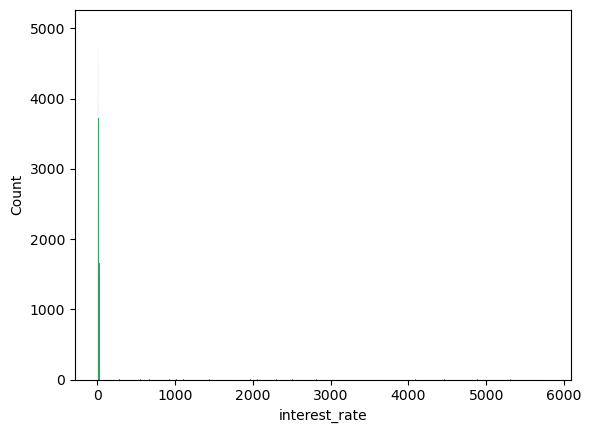

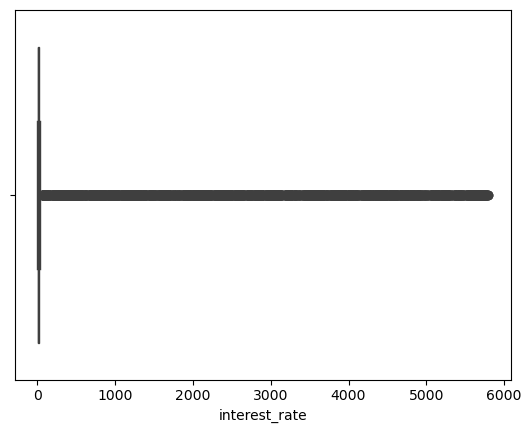

<Figure size 640x480 with 0 Axes>

In [18]:
#interest_rate column
#we have outliers 
sns.histplot(x=df[lst_num[3]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[3]],color=np.random.rand(3,))
plt.figure()

In [19]:
#apply descriptive statistics to this column first so we can apply outlier filter 
#make range from q1 to q2 (75%)
df['interest_rate'].describe()

count    100000.000000
mean         72.466040
std         466.422621
min           1.000000
25%           8.000000
50%          13.000000
75%          20.000000
max        5797.000000
Name: interest_rate, dtype: float64

In [20]:
#handle interest rate outliers manually for range 1 and 26  otherwise it will replaced with median of age
lst_interest=df[(df['interest_rate'] < 1) | (df['interest_rate'] > 26)].index
lst_interest

Index([   44,    89,   104,   105,   106,   107,   108,   109,   110,   111,
       ...
       99914, 99984, 99985, 99986, 99987, 99988, 99989, 99990, 99991, 99997],
      dtype='int64', length=14778)

In [21]:
for i in lst_interest:
    df[lst_num[3]].iloc[i]=df['interest_rate'].median()

<Figure size 640x480 with 0 Axes>

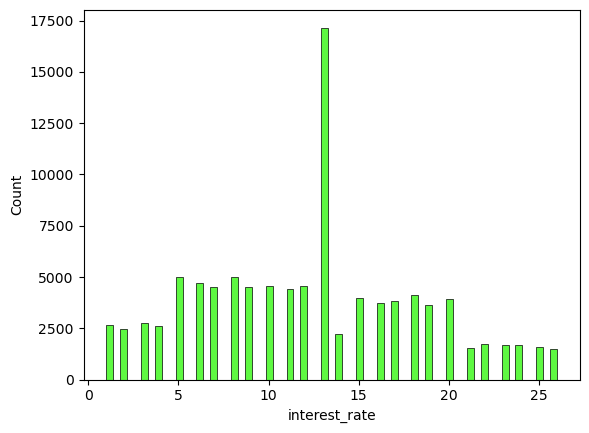

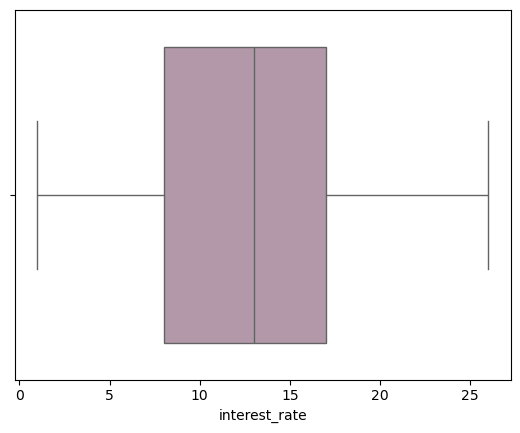

<Figure size 640x480 with 0 Axes>

In [22]:
#check if there are outliers left
sns.histplot(x=df[lst_num[3]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[3]],color=np.random.rand(3,))
plt.figure()

<Figure size 640x480 with 0 Axes>

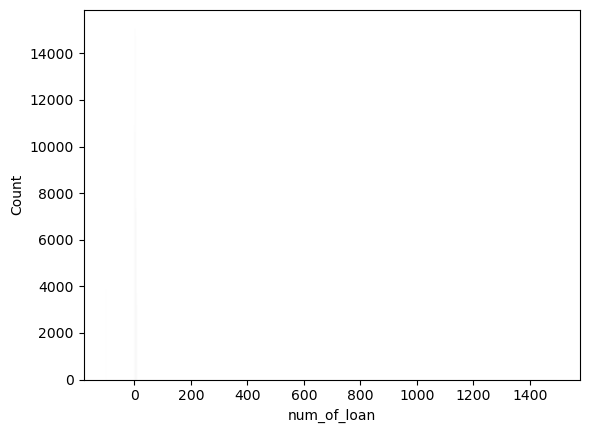

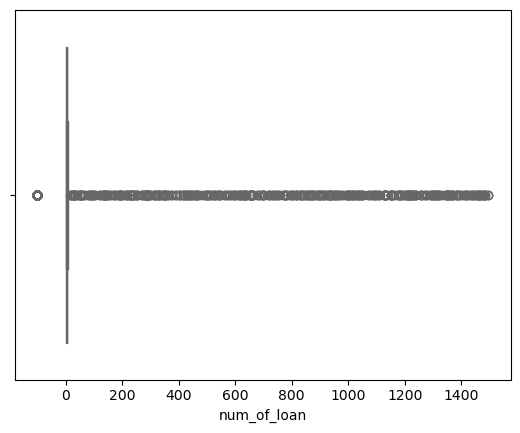

<Figure size 640x480 with 0 Axes>

In [23]:
#num_of_loan column
#we have outliers 
sns.histplot(x=df[lst_num[4]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[4]],color=np.random.rand(3,))
plt.figure()

In [24]:
#handle num of loan outliers manually for range 1 and 10  otherwise it will replaced with median of age
lst_loan=df[(df['num_of_loan'] < 1) | (df['num_of_loan'] > 10)].index
lst_loan

Index([   21,    31,    32,    33,    34,    35,    36,    37,    38,    39,
       ...
       99936, 99937, 99938, 99939, 99940, 99941, 99942, 99943, 99969, 99987],
      dtype='int64', length=15278)

In [25]:
for i in lst_loan:
    df[lst_num[4]].iloc[i]=df['num_of_loan'].median()

<Figure size 640x480 with 0 Axes>

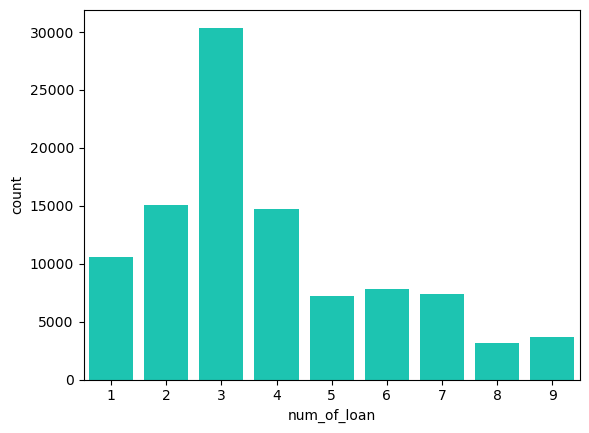

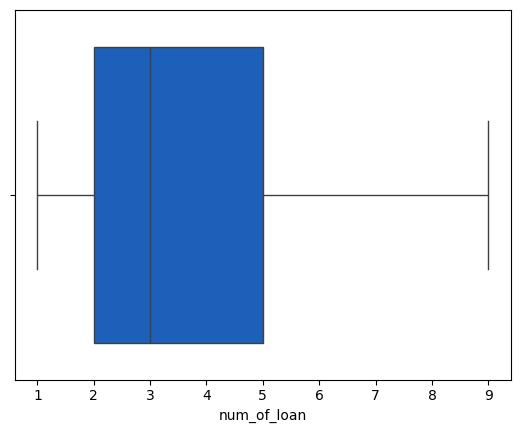

<Figure size 640x480 with 0 Axes>

In [26]:
#check if there are outliers left
#we will use count plot for better preview because it is alimited number of special variables
sns.countplot(x=df[lst_num[4]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[4]],color=np.random.rand(3,))
plt.figure()

<Figure size 640x480 with 0 Axes>

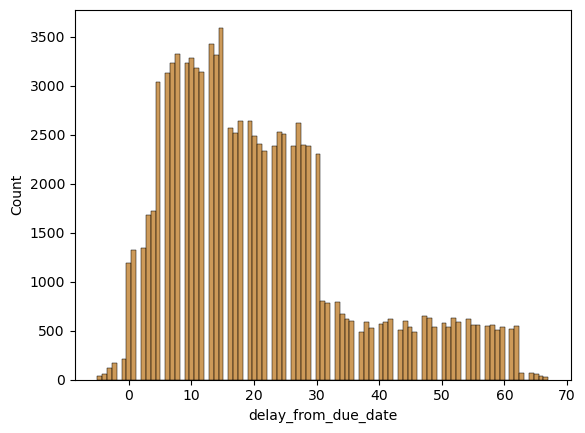

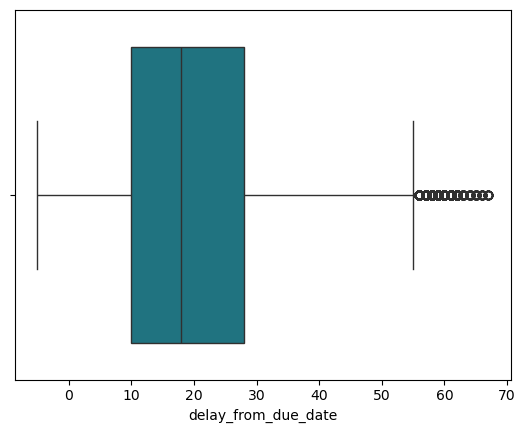

<Figure size 640x480 with 0 Axes>

In [27]:
#delay_from_due_date column
#we have outliers 
sns.histplot(x=df[lst_num[5]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[5]],color=np.random.rand(3,))
plt.figure()

In [28]:
#apply descriptive statistics to this column first so we can apply outlier filter 
#make range from q1 to q2 (75%)
df['delay_from_due_date'].describe()

count    100000.000000
mean         21.068780
std          14.860104
min          -5.000000
25%          10.000000
50%          18.000000
75%          28.000000
max          67.000000
Name: delay_from_due_date, dtype: float64

In [29]:
#handle delay from due date outliers manually for range 0 and 55  otherwise it will replaced with median of age
lst_date=df[(df['delay_from_due_date'] < 0) | (df['delay_from_due_date'] > 55)].index
lst_date

Index([    1,    49,    74,    78,    79,    88,    95,   232,   233,   234,
       ...
       99402, 99403, 99404, 99405, 99406, 99407, 99421, 99423, 99426, 99667],
      dtype='int64', length=4593)

In [30]:
for i in lst_date:
    df[lst_num[5]].iloc[i]=df['delay_from_due_date'].median()

<Figure size 640x480 with 0 Axes>

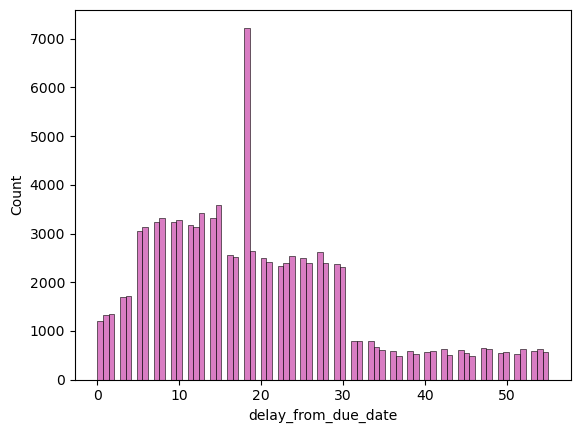

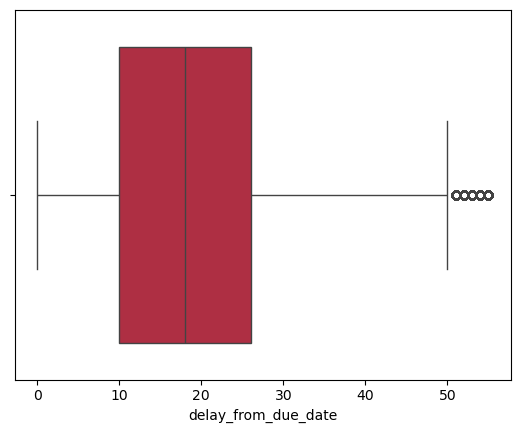

<Figure size 640x480 with 0 Axes>

In [31]:
#check if there are outliers left
sns.histplot(x=df[lst_num[5]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[5]],color=np.random.rand(3,))
plt.figure()

<Figure size 640x480 with 0 Axes>

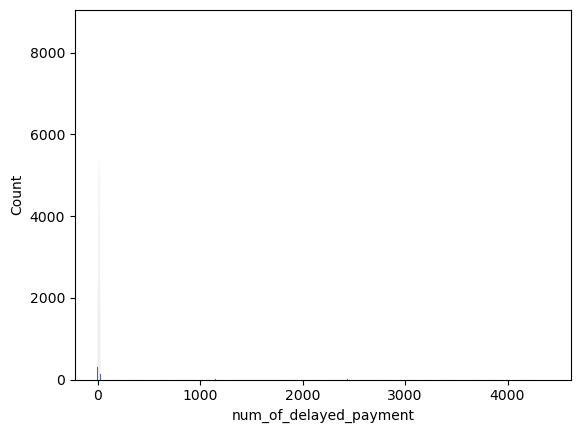

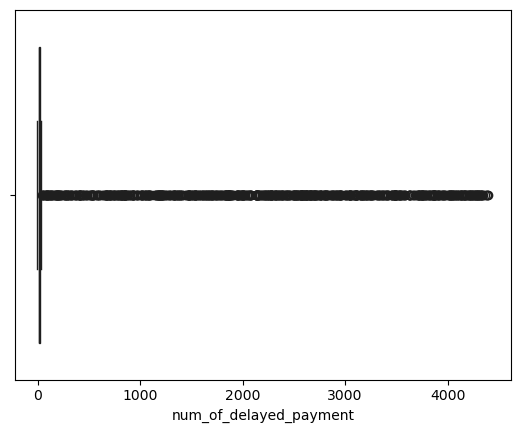

<Figure size 640x480 with 0 Axes>

In [32]:
#num_of_delayed_payment column
#we have outliers 
sns.histplot(x=df[lst_num[6]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[6]],color=np.random.rand(3,))
plt.figure()

In [33]:
#apply descriptive statistics to this column first so we can apply outlier filter 
#make range from q1 to q2 (75%)
df['num_of_delayed_payment'].describe()

count    100000.000000
mean         28.758090
std         218.117625
min          -3.000000
25%           8.000000
50%          13.000000
75%          18.000000
max        4397.000000
Name: num_of_delayed_payment, dtype: float64

In [34]:
#handle number of delayed payment  outliers manually for range 1 and 40  otherwise it will replaced with median of age
lst_payment=df[(df['num_of_delayed_payment'] < 1) | (df['num_of_delayed_payment'] > 40)].index
lst_payment

Index([    1,     4,    10,    13,    30,    32,    33,    70,    72,    73,
       ...
       99969, 99970, 99971, 99972, 99973, 99974, 99975, 99992, 99993, 99998],
      dtype='int64', length=9991)

In [35]:
for i in lst_payment:
    df[lst_num[6]].iloc[i]=df['num_of_delayed_payment'].median()

<Figure size 640x480 with 0 Axes>

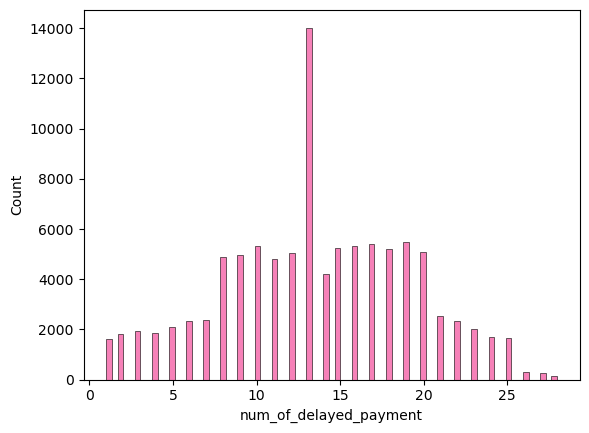

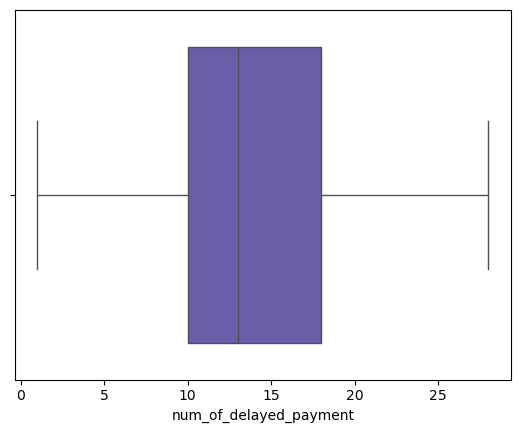

<Figure size 640x480 with 0 Axes>

In [36]:
#check if there are outliers left
sns.histplot(x=df[lst_num[6]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[6]],color=np.random.rand(3,))
plt.figure()

<Figure size 640x480 with 0 Axes>

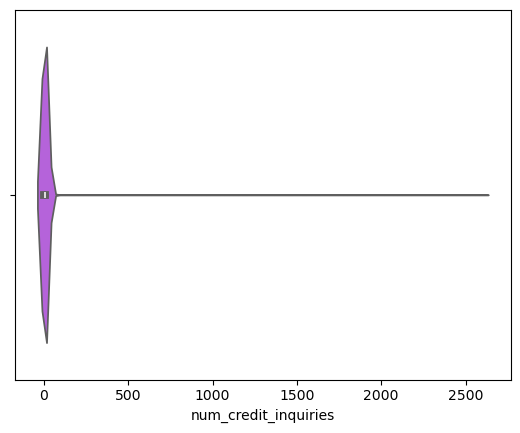

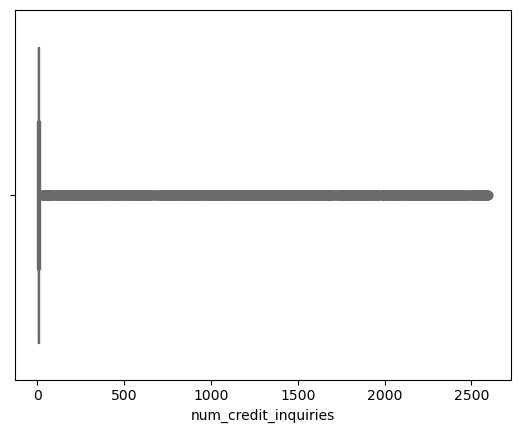

<Figure size 640x480 with 0 Axes>

In [37]:
#num_of_credit_inquiries column
#we have outliers 
#we will use violin beacuse too much special varaibles
sns.violinplot(x=df[lst_num[7]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[7]],color=np.random.rand(3,))
plt.figure()

In [38]:
#apply descriptive statistics to this column first so we can apply outlier filter 
#make range from q1 to q2 (75%)
df['num_credit_inquiries'].describe()

count    100000.000000
mean         27.208880
std         191.308723
min           0.000000
25%           3.000000
50%           5.000000
75%           9.000000
max        2597.000000
Name: num_credit_inquiries, dtype: float64

In [39]:
#handle number of credit inquiries outliers manually for range 0 and 9  otherwise it will replaced with median of age
lst_inquiries=df[(df['num_credit_inquiries'] < 0) | (df['num_credit_inquiries'] > 9)].index
lst_inquiries

Index([  140,   141,   142,   143,   173,   191,   192,   193,   194,   195,
       ...
       99844, 99845, 99846, 99847, 99850, 99851, 99853, 99854, 99855, 99872],
      dtype='int64', length=20275)

In [40]:
for i in lst_inquiries:
    df[lst_num[7]].iloc[i]=df['num_credit_inquiries'].median()

<Figure size 640x480 with 0 Axes>

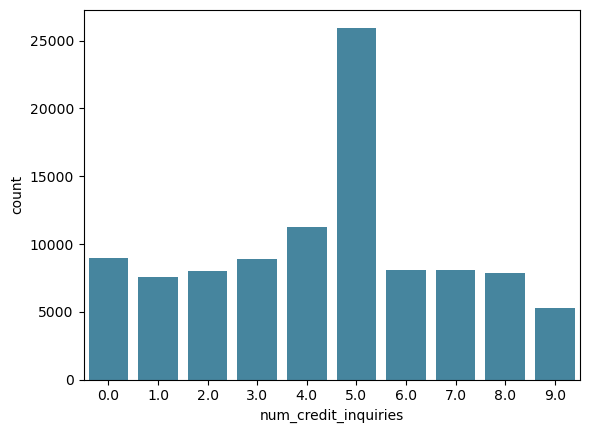

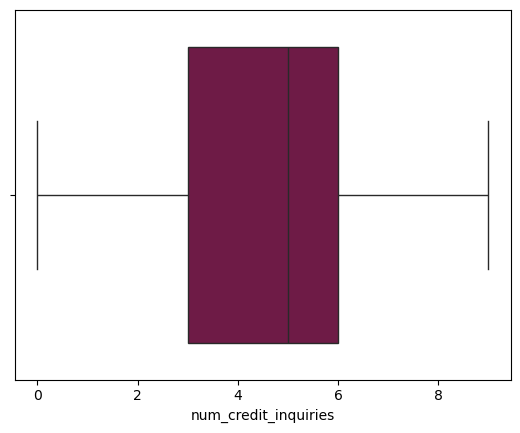

<Figure size 640x480 with 0 Axes>

In [41]:
#check if there are outliers left
#we will use count plot for better preview because it is a limited number of special variables
sns.countplot(x=df[lst_num[7]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[7]],color=np.random.rand(3,))
plt.figure()

<Figure size 640x480 with 0 Axes>

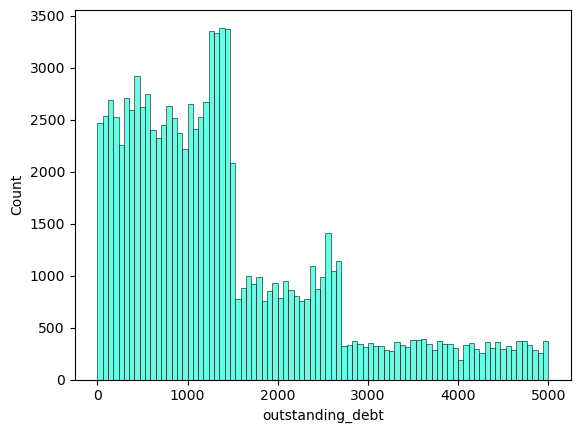

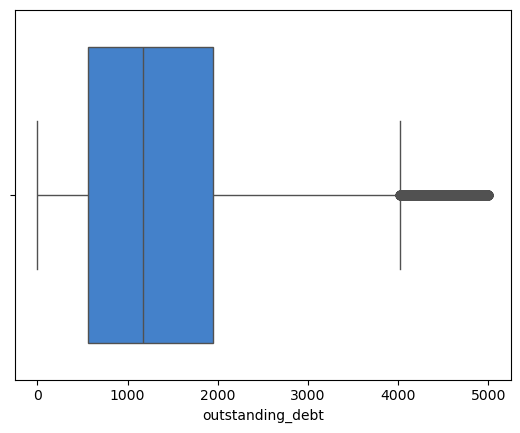

<Figure size 640x480 with 0 Axes>

In [42]:
#outstanding_debt column
sns.histplot(x=df[lst_num[8]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[8]],color=np.random.rand(3,))
plt.figure()

In [43]:
#there are no outliers here because there is no limit for debt

<Figure size 640x480 with 0 Axes>

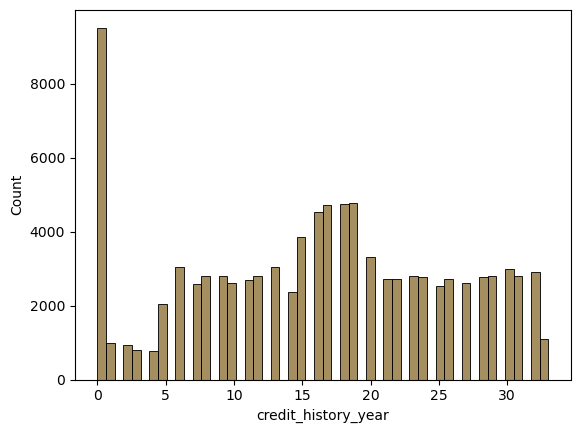

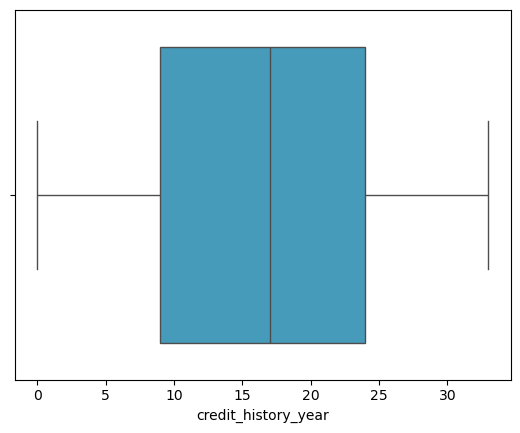

<Figure size 640x480 with 0 Axes>

In [44]:
#credit_history_year column
sns.histplot(x=df[lst_num[13]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[13]],color=np.random.rand(3,))
plt.figure()

In [45]:
#there are no outliers here 

<Figure size 640x480 with 0 Axes>

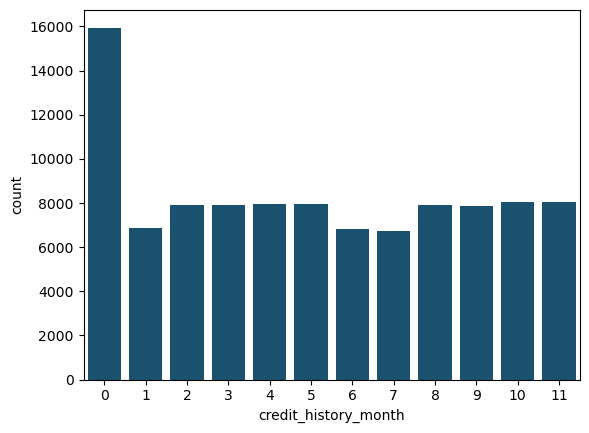

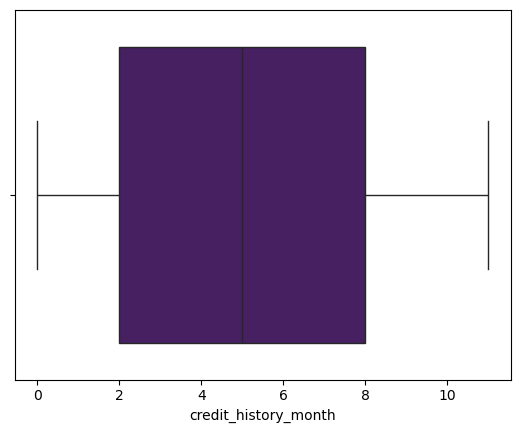

<Figure size 640x480 with 0 Axes>

In [46]:
#credit_history_month column
#we will use count plot for better preview because it is a limited number of special variables
sns.countplot(x=df[lst_num[14]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[14]],color=np.random.rand(3,))
plt.figure()

In [47]:
#there are no outliers here 

<Figure size 640x480 with 0 Axes>

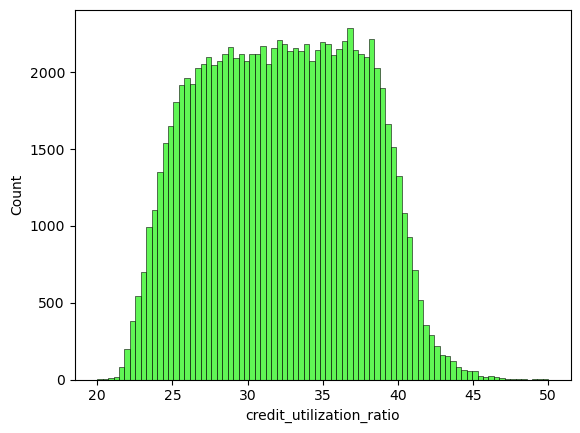

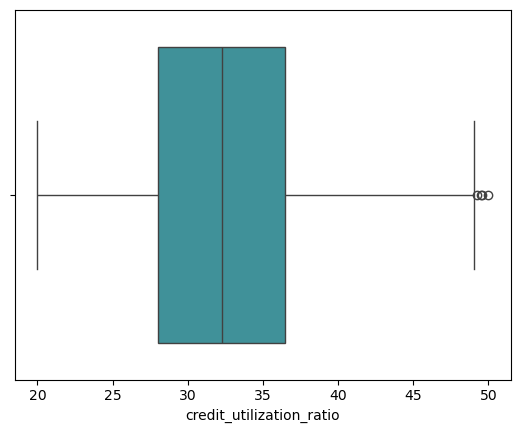

<Figure size 640x480 with 0 Axes>

In [48]:
#credit_utilization_ratio column
sns.histplot(x=df[lst_num[9]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[9]],color=np.random.rand(3,))
plt.figure()

In [49]:
#handle credit utilization ration automatically
lst_utilization=detect_outliers(df,0,['credit_utilization_ratio'])
lst_utilization

[9382, 17029, 62954, 68000]

In [50]:
#there are no outliers here as we saw the list of index of outliers is empty

<Figure size 640x480 with 0 Axes>

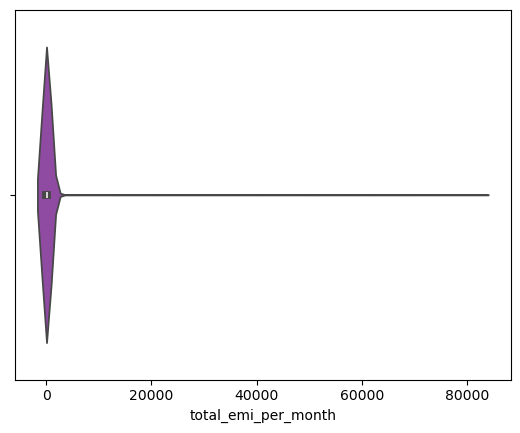

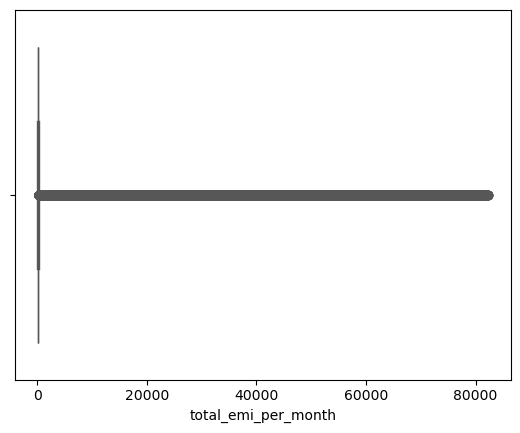

<Figure size 640x480 with 0 Axes>

In [51]:
#total_emi_per_month column
#we have outliers
#we will use violin beacuse too much special varaibles
sns.violinplot(x=df[lst_num[10]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[10]],color=np.random.rand(3,))
plt.figure()

In [52]:
#apply descriptive statistics to this column first so we can apply outlier filter 
#make range from q1 to q2 (75%)
df['total_emi_per_month'].describe()

count    100000.000000
mean       1403.118217
std        8306.041270
min           0.000000
25%          30.306660
50%          69.249473
75%         161.224249
max       82331.000000
Name: total_emi_per_month, dtype: float64

In [53]:
#handle number of credit inquiries outliers manually for range 1 and 400  otherwise it will replaced with median of age
lst_total=df[(df['total_emi_per_month'] < 1) | (df['total_emi_per_month'] > 400)].index
lst_total

Index([   32,    33,    34,    35,    36,    37,    38,    39,    40,    41,
       ...
       99938, 99939, 99940, 99941, 99942, 99943, 99960, 99970, 99985, 99993],
      dtype='int64', length=16216)

In [54]:
for i in lst_total:
    df[lst_num[1]].iloc[i]=df['total_emi_per_month'].median()

<Figure size 640x480 with 0 Axes>

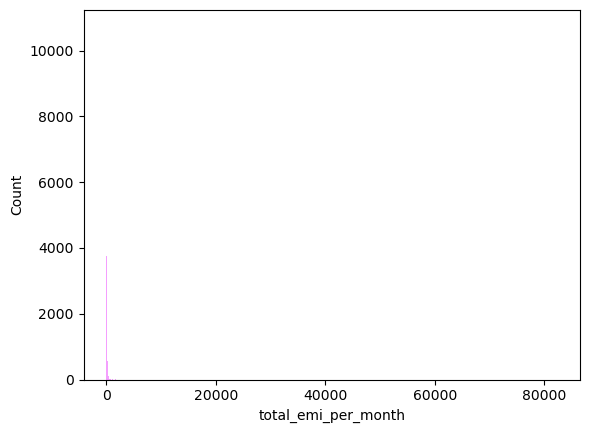

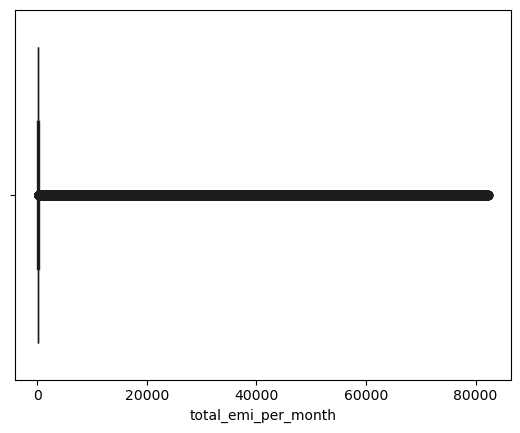

<Figure size 640x480 with 0 Axes>

In [55]:
#check if there are outliers left
sns.histplot(x=df[lst_num[10]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[10]],color=np.random.rand(3,))
plt.figure()

<Figure size 640x480 with 0 Axes>

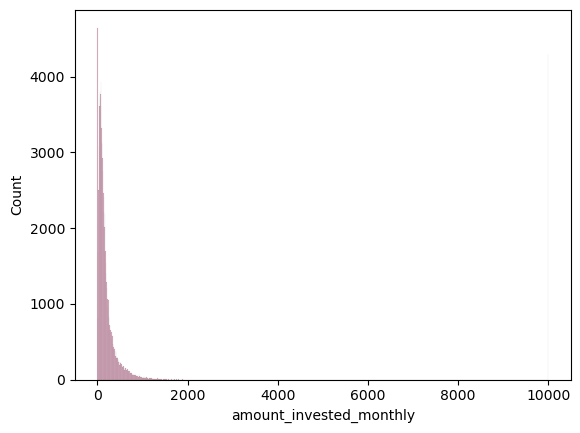

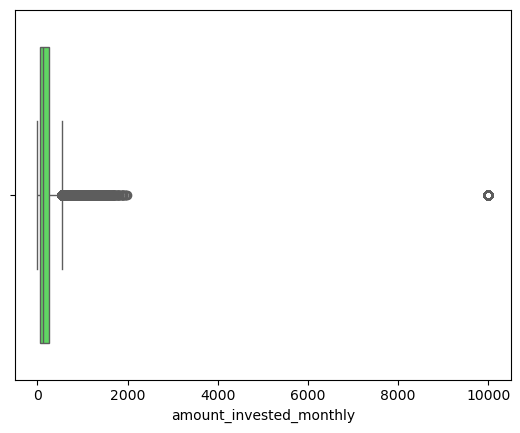

<Figure size 640x480 with 0 Axes>

In [56]:
#amount_invested_monthly column
#we have outliers
sns.histplot(x=df[lst_num[11]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[11]],color=np.random.rand(3,))
plt.figure()

In [57]:
#apply descriptive statistics to this column first so we can apply outlier filter 
#make range from q1 to q2 (75%)
df['amount_invested_monthly'].describe()

count    100000.000000
mean        608.407910
std        2001.475997
min           0.000000
25%          67.000000
50%         128.000000
75%         255.000000
max       10000.000000
Name: amount_invested_monthly, dtype: float64

In [58]:
#handle amount of invested monthly outliers manually for range 1 and 400  otherwise it will replaced with median of age
lst_invested=df[(df['amount_invested_monthly'] < 1) | (df['amount_invested_monthly'] > 400)].index
lst_invested

Index([   18,    19,    20,    23,    28,    43,    49,    54,    55,    60,
       ...
       99944, 99948, 99950, 99951, 99956, 99961, 99964, 99973, 99974, 99992],
      dtype='int64', length=19532)

In [59]:
for i in lst_invested:
    df[lst_num[11]].iloc[i]=df['amount_invested_monthly'].median()

<Figure size 640x480 with 0 Axes>

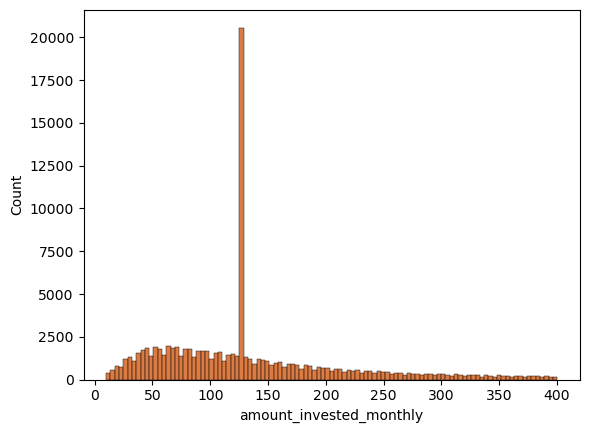

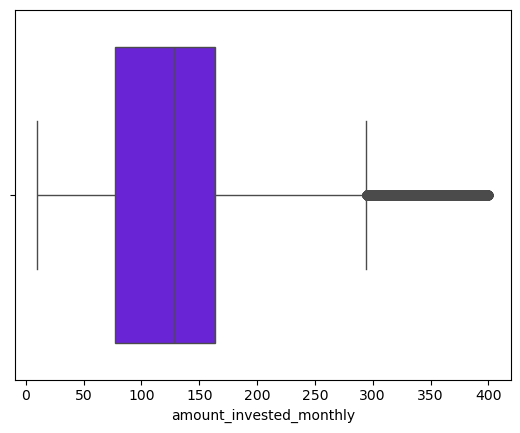

<Figure size 640x480 with 0 Axes>

In [60]:
#check if there are outliers left
sns.histplot(x=df[lst_num[11]],color=np.random.rand(3,))
plt.figure()
sns.boxplot(x=df[lst_num[11]],color=np.random.rand(3,))
plt.figure()

In [61]:
#monthly_balance column
#apply descriptive statistics to this column first so we can apply outlier filter 
#make range from q1 to q2 (75%)
df['monthly_balance'].describe()

count    1.000000e+05
mean    -1.928763e+05
std      2.037201e+07
min     -2.147484e+09
25%      2.670000e+02
50%      3.340000e+02
75%      4.670000e+02
max      1.602000e+03
Name: monthly_balance, dtype: float64

In [62]:
#there is no outliers here

## overall view after finishing univariete analysis

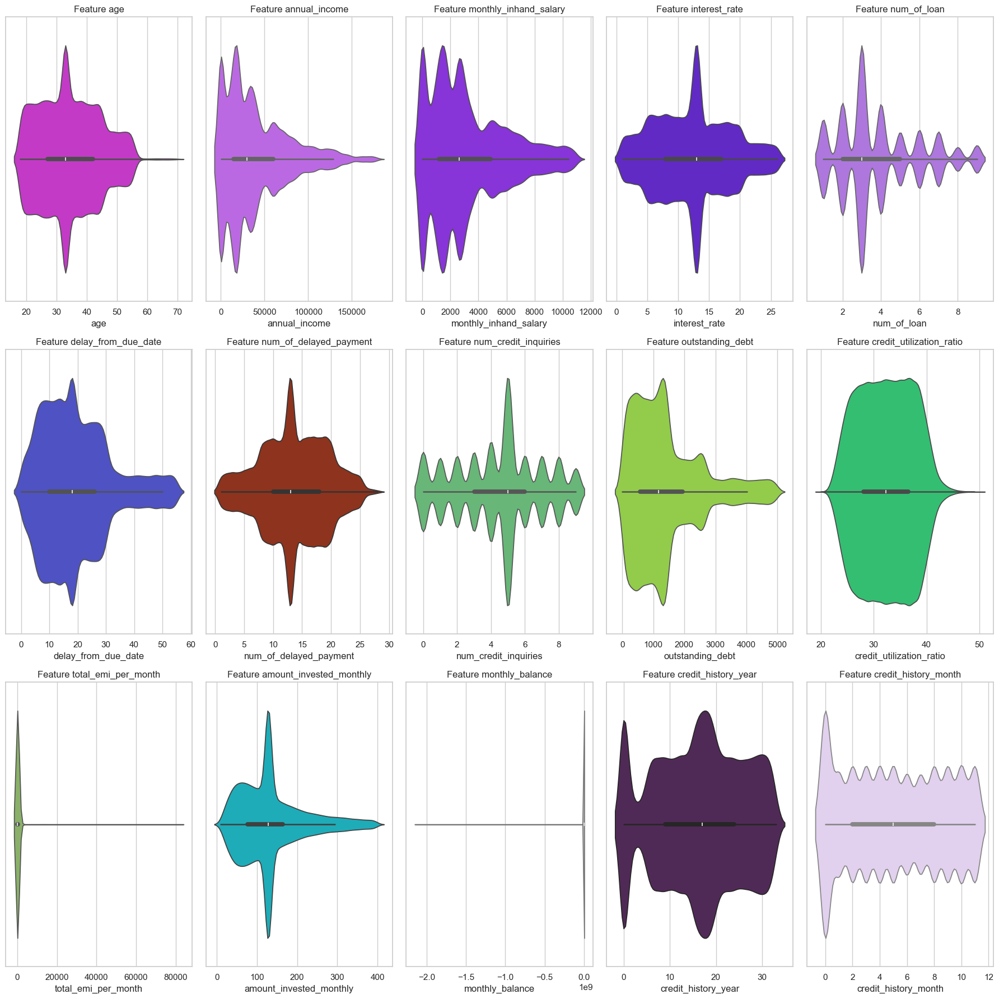

In [63]:
#lets check our numerical data after erasing all outliers
#setting up figure configurations
num_vars = df.select_dtypes('number')
#set the style of seaborn grid
sns.set(style='whitegrid')  
#create subplots with fixed size 
fig, axes = plt.subplots(3, 5, figsize=(18, 18)) 
#make axes flat
axes = axes.flatten()
#collect the index number and the column name together from the array od df.select_dtypes('number').columns
for i, feature in enumerate(num_vars.columns):
    #use voilin with axes with custom title for every plot and random color to get smart visual
    #we use voilin instead of usual hist plot because it is the fatster plot for rendering the large data scale
    sns.violinplot(x=df[feature], ax=axes[i], color=np.random.rand(3,))  
    axes[i].set_title(f'Feature {feature}')  

#to fit plots into figure area view purpose
plt.tight_layout()
#to show all the generated plots from looping
plt.show()

In [64]:
#lets move to the categorical columns and see it is structure
lst_obj=df.select_dtypes('O').columns.to_list()
lst_obj

['credit_mix', 'payment_of_min_amount', 'payment_behaviour', 'credit_score']

In [65]:
#credit_mix column has special varaible which is '_' and it is impossible to represent at graph so we need to replace it
for i in lst_obj :
    print(f'for feature {i} : \n',df[i].value_counts())

for feature credit_mix : 
 credit_mix
Standard    36479
Good        24337
_           20195
Bad         18989
Name: count, dtype: int64
for feature payment_of_min_amount : 
 payment_of_min_amount
Yes    52326
No     35667
NM     12007
Name: count, dtype: int64
for feature payment_behaviour : 
 payment_behaviour
Low_spent_Small_value_payments      25513
High_spent_Medium_value_payments    17540
Low_spent_Medium_value_payments     13861
High_spent_Large_value_payments     13721
High_spent_Small_value_payments     11340
Low_spent_Large_value_payments      10425
!@9#%8                               7600
Name: count, dtype: int64
for feature credit_score : 
 credit_score
Standard    53174
Poor        28998
Good        17828
Name: count, dtype: int64


In [66]:
df['credit_mix']=df['credit_mix'].replace(0,'unknown')

In [67]:
#also convert these object features into string again
for i in lst_obj:
    df[i]=df[i].astype(object)

In [68]:
#check the data type of object features again
df.dtypes

age                           int64
annual_income               float64
monthly_inhand_salary       float64
interest_rate                 int64
num_of_loan                   int64
delay_from_due_date           int64
num_of_delayed_payment        int64
num_credit_inquiries        float64
credit_mix                   object
outstanding_debt              int64
credit_utilization_ratio    float64
payment_of_min_amount        object
total_emi_per_month         float64
amount_invested_monthly       int64
payment_behaviour            object
monthly_balance               int64
credit_score                 object
credit_history_year           int64
credit_history_month          int64
dtype: object

In [69]:
for i in lst_obj:
    fig=px.histogram(df,x=df[i],color_discrete_sequence=['blue'],title=f'feature {i}',text_auto=True)
    fig.update_layout(title_x=0.5)
    fig.show()

## bi variate analysis and see every column impact on the target

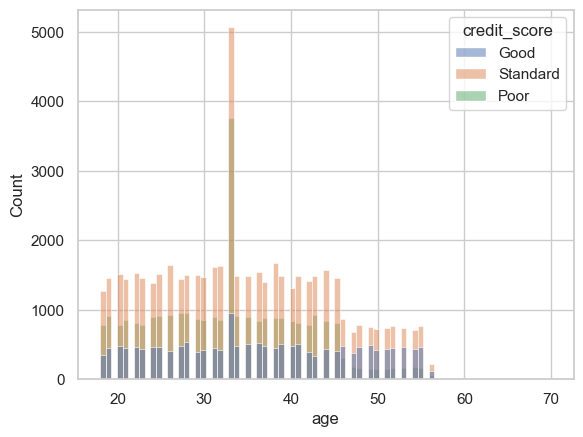

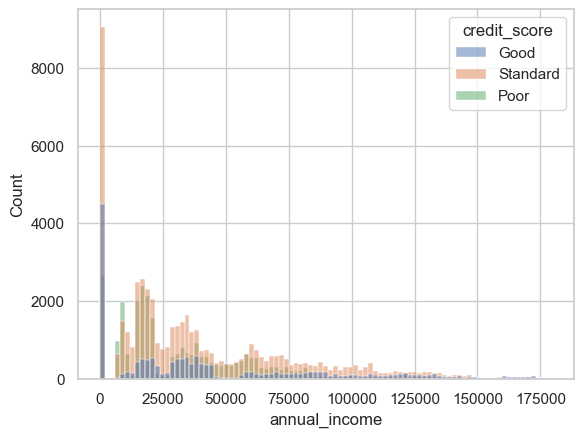

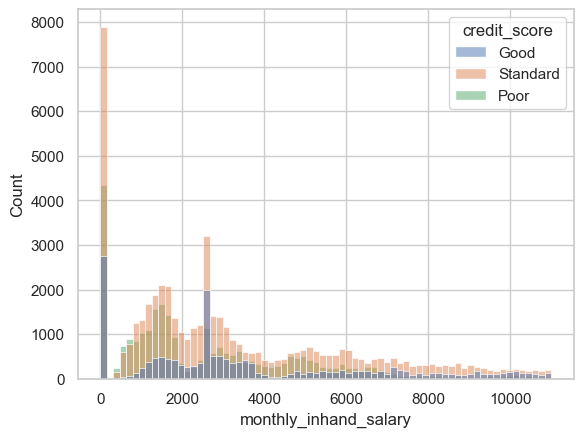

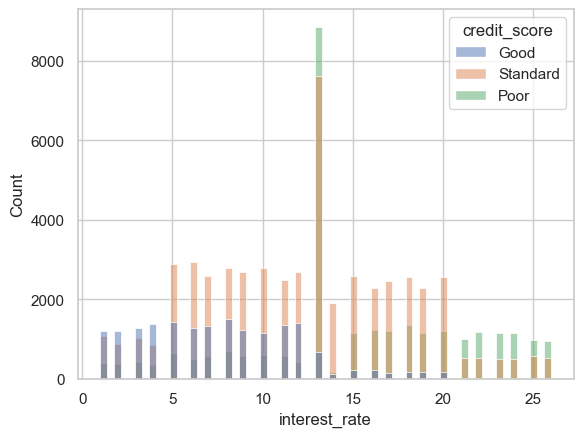

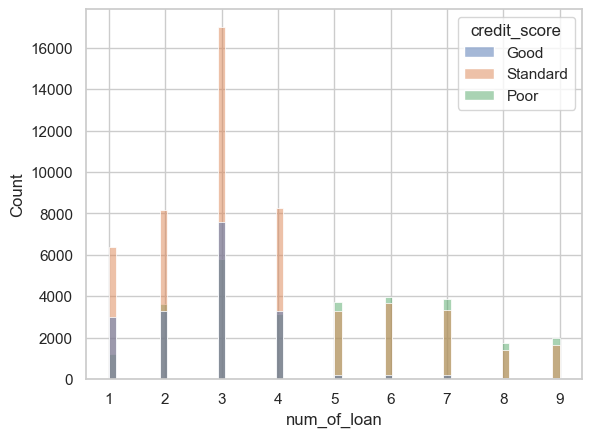

...

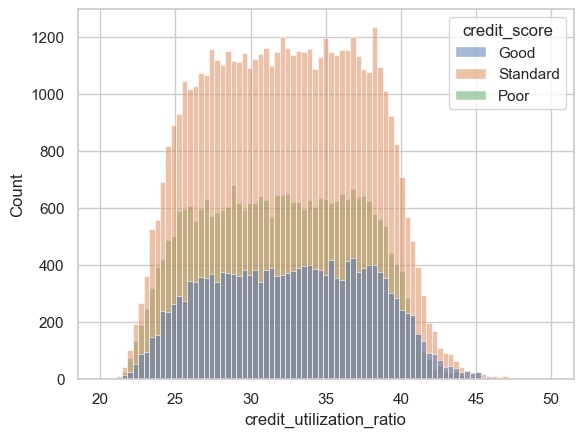

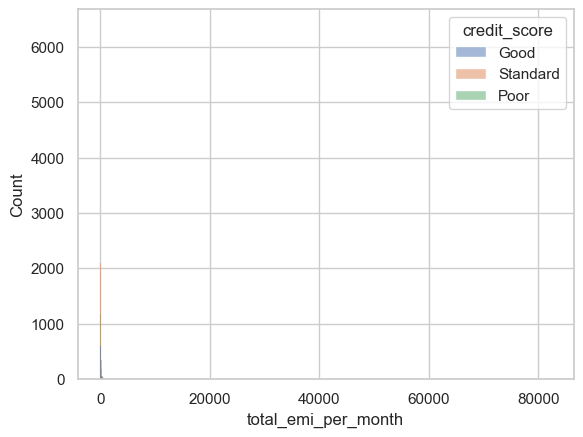

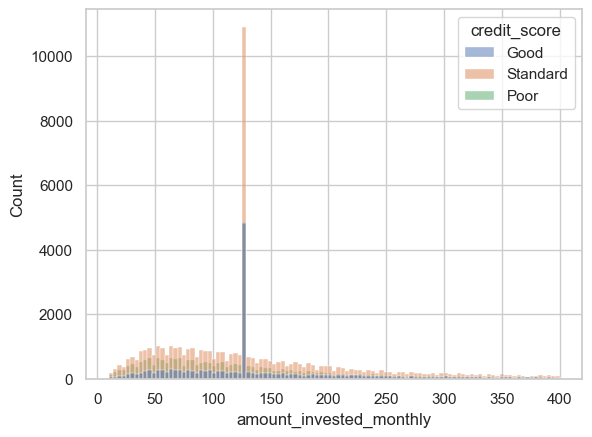

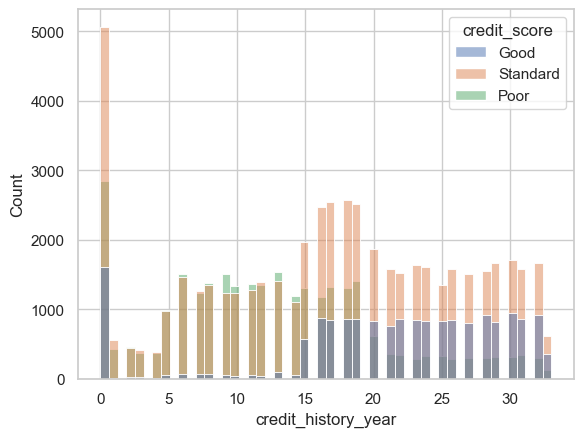

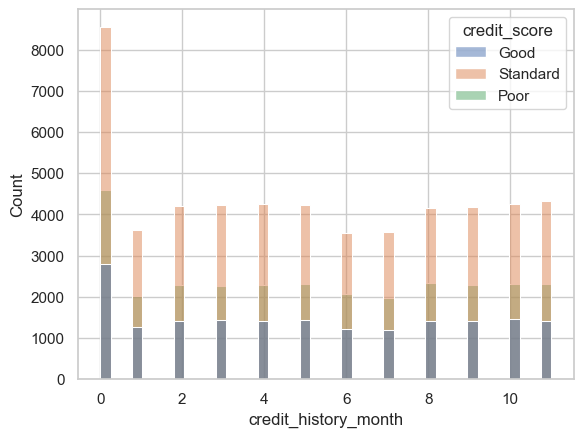

<Figure size 640x480 with 0 Axes>

In [70]:
#lets move to another tour 
#see every column vs our target column
#first apply numerical columns with hue of target
for i in df.select_dtypes('number').columns :
    if i == 'monthly_balance':
    #we can skip this feature because it takes long time to render    
        continue
    else :    
        sns.histplot(data=df,x=df[i],hue='credit_score',color=np.random.rand(3,))
        plt.figure()

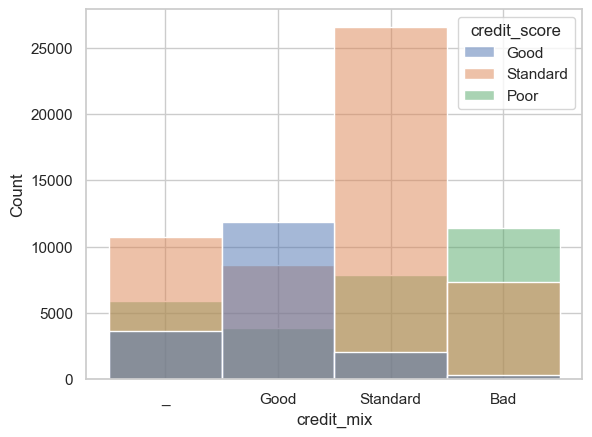

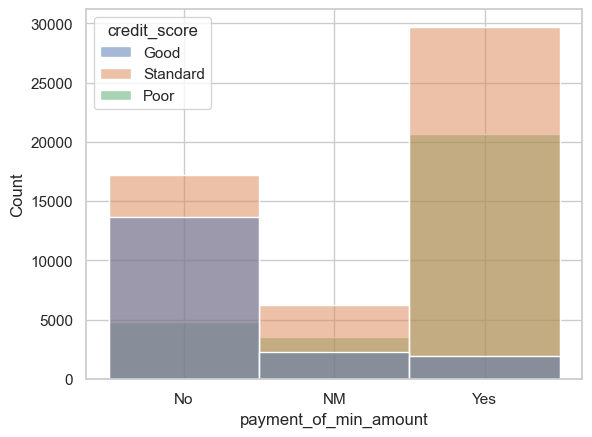

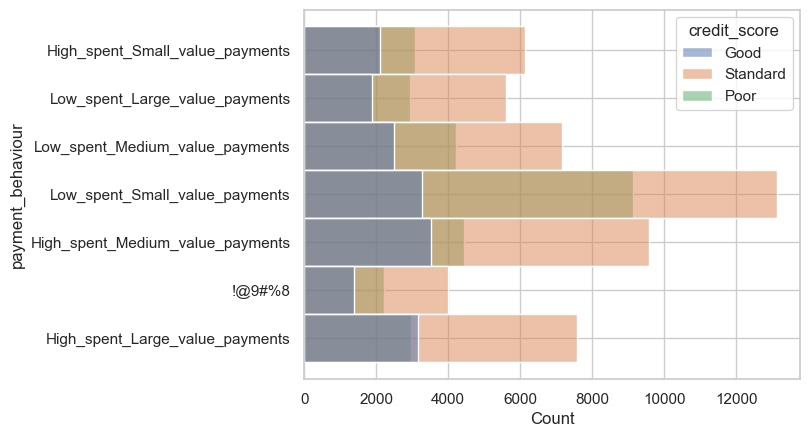

<Figure size 640x480 with 0 Axes>

In [71]:
#second apply categorical columns with hue of target
for i in df.select_dtypes('O').columns :
    if i == 'credit_score':
    #we can skip this feature because it is the target    
        continue
    elif i == 'payment_behaviour' :
    #make it seperate feature and plot on y beacuase it has too much speacial variable   
        sns.histplot(data=df,y=df[i],hue='credit_score',color=np.random.rand(3,))
        plt.figure()
    else :    
        sns.histplot(data=df,x=df[i],hue='credit_score',color=np.random.rand(3,))
        plt.figure()

## lets now ask questions and extract some bussiness insights 

In [72]:
#what is the most group of ages impact the target ?
#first apply domain knowledge feature and extract which age locate in which age group
#create decade for every age group from 18 till 70 years old
age_range=[18, 28, 38, 48, 58, 70]
#create label for every age
age_label=['18-28', '28-38', '38-48', '48-58', '58-70']
#create the new column with pandas cut function
df['age_group']=pd.cut(df['age'], bins=age_range, labels=age_label, right=False)

<Axes: xlabel='age_group', ylabel='count'>

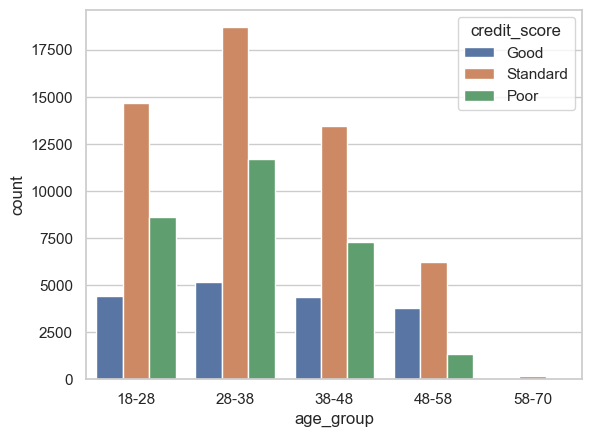

In [73]:
sns.countplot(data=df,x='age_group', hue='credit_score')
#the most group of ages impact the target is 28-38 with standard score

In [74]:
#descriptive analysis for annual income with every category of credit score
#for poor credit score
df[df['credit_score'] == 'Poor']['annual_income'].describe()

count     28998.000000
mean      34895.408799
std       30345.965677
min          69.249473
25%       14785.000000
50%       21963.000000
75%       52243.000000
max      178814.000000
Name: annual_income, dtype: float64

In [75]:
#for standard credit score
df[df['credit_score'] == 'Standard']['annual_income'].describe()

count     53174.000000
mean      40125.982792
std       37379.349505
min          69.249473
25%       14013.500000
50%       29758.000000
75%       61631.500000
max      179317.000000
Name: annual_income, dtype: float64

In [76]:
#for good credit score
df[df['credit_score'] == 'Good']['annual_income'].describe()

count     17828.000000
mean      46601.679164
std       46454.605838
min          69.249473
25%          69.249473
50%       32901.000000
75%       77477.000000
max      179317.000000
Name: annual_income, dtype: float64

## conclusion
## we notice that the mean values of annual income for poor credit score is smaller than standard  than good 

## it means that people who has better score has better annual income

## count of people in standrad category is more than good more than bad

In [77]:
#lets visuale our insight
px.histogram(df,y=df['credit_score'],x=df['annual_income'],histfunc='avg',title='credit score vs annual income',text_auto=True)

<Axes: xlabel='num_credit_inquiries', ylabel='Count'>

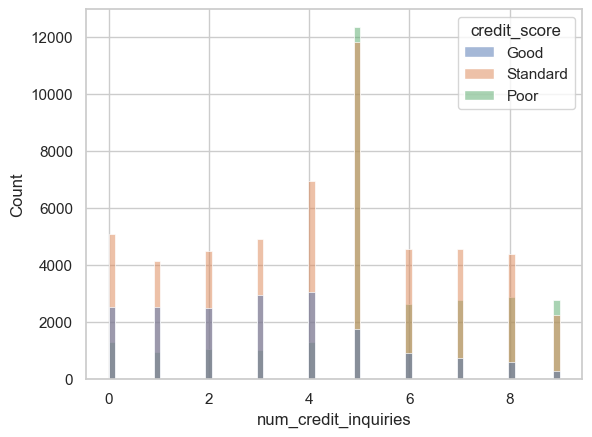

In [78]:
#what is the most number of credit inquiries impact credit score ?
sns.histplot(data=df,x='num_credit_inquiries',hue='credit_score',color=np.random.rand(3,))

In [79]:
#we found that 5 is the most number of inquiries impact credit score
#lets describe it in statistics
#most of this category has poor score
df[df['num_credit_inquiries'] == 5]['credit_score'].describe()

count     25968
unique        3
top        Poor
freq      12360
Name: credit_score, dtype: object

In [80]:
#visualize the credit score in pie chart
#most of people are in standard category
px.pie(df,names='credit_score')

# conclusion :

## most of columns has the gaussian distribution so the best classical classification models to be applied

## Gaussian Naive Bayes , Logistic Regression , SVM , Decision Tress and Random forest

## extract clean version of df to be used in our next phases with encoding= 'latin-1' to avoid any kind of errors 

In [81]:
df.to_csv('../data/processed/eda_df.csv',encoding = 'latin-1')